In [1]:
!which python

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from cicada.utils import data
from cicada.utils import models
from cicada.utils import visualisation as viz
from cicada import training
from cicada import agent

In [4]:
from kaggle_environments.envs.football.helpers import human_readable_agent
from kaggle_environments import make

In [5]:
import numpy as np
import pandas as pd
from ipywidgets import interact
from copy import deepcopy
from tqdm.notebook import tqdm
import seaborn as sns
import json
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [6]:
import lightgbm as lgb
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV, RidgeClassifierCV
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
import joblib

In [7]:
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

# Single game with diagnostics

In [8]:
# agent = SimpleAgent()
agent.plans.models.load_lgb_models()
agent_obj = agent.Agent(noise_sd=0)

env = make("football", configuration={
    "save_video": True, 
    "scenario_name": "11_vs_11_kaggle",
#     "scenario_name": "academy_counterattack_hard",
#     "scenario_name": "academy_run_to_score_with_keeper", 
#     "scenario_name": "academy_pass_and_shoot_with_keeper",
    "running_in_notebook": True,
#     "episodeSteps": 200,
})

trainer = env.train([None, "simple_rules_based_agent.py"])
obs = trainer.reset()
while not env.done:
#     import pdb; pdb.set_trace()
    action = agent_obj.action_wrapper(obs)
    obs, reward, done, info = trainer.step(action)

env.render(mode="human", width=800, height=600)

/Users/liamkirwin/repo/cicada/cicada/utils/calculation.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  slope_a = (opp_a[1] - pos[1]) / (opp_a[0] - pos[0])
/Users/liamkirwin/repo/cicada/cicada/utils/calculation.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  slope_b = (opp_b[1] - pos[1]) / (opp_b[0] - pos[0])


In [9]:
fig = viz.make_figure_widget(25)

In [10]:
@interact(view_step=(0, len(env.steps) - 2))
def interactive_display(view_step=0):
    step = deepcopy(env.steps[view_step])
    log_step = agent_obj.state.log[view_step]
    state = data.State(data.step_to_obs(step))
    fig.update(data=viz.get_traces(state, log_step))
    viz.print_diagnostics(state, log_step)
fig

interactive(children=(IntSlider(value=0, description='view_step', max=3000), Output()), _dom_classes=('widget-…

FigureWidget({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': 'darkorange',
            …

In [11]:
stop

NameError: name 'stop' is not defined

In [12]:
models.short_pass_inner_function(agent_obj.state.log)

,type,player,step,queued_at,pos_score_data.posx,pos_score_data.posy,pos_score_data.dnet,pos_score_data.view,pos_score_data.dopp,pos_score_data.kopp,pos_score_data.score,eval_data.timestep,eval_data.kick_countdown,eval_data.pass_error,eval_data.pass_error_diff,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.pass_distance,eval_data.opp_dist_to_line,eval_data.opp_dist_to_active,eval_data.prb_success,target
19,SHORT_PASS_ATTEMPT,7,480,472.0,0.119963,0.018192,0.880225,0.071592,0.078232,54.788335,18.259355,5.0,0.0,9.370654,8.040935,0.0,14.954886,0.266675,243.481278,0.007102,0.254694,0
31,SHORT_PASS_ATTEMPT,10,690,689.0,0.698315,0.191791,0.357488,0.264687,0.086372,44.531517,38.038090,2.0,9.0,17.514697,26.689668,0.0,26.639997,0.173274,108.339938,0.021278,0.443368,1
40,SHORT_PASS_ATTEMPT,6,940,938.0,-0.510086,0.218984,1.525881,0.040417,0.100000,33.853351,7.960468,5.0,0.0,11.767089,37.859114,0.0,72.366987,0.157930,119.432324,0.019992,0.616213,0
42,SHORT_PASS_ATTEMPT,6,946,945.0,-0.597522,0.244117,1.616066,0.000048,0.100000,28.517870,6.664558,0.0,5.0,10.337208,41.187587,0.0,69.926344,0.163638,91.870801,0.034627,0.687711,1
44,SHORT_PASS_ATTEMPT,10,1015,1014.0,0.175139,0.359155,0.899660,0.111055,0.100000,34.434425,17.732245,0.0,6.0,3.385901,35.602201,0.0,16.149312,0.179081,123.608110,0.019674,0.538310,1
53,SHORT_PASS_ATTEMPT,0,1303,1301.0,-0.985004,-0.005647,1.985012,0.035338,0.100000,13.624549,10.869842,5.0,0.0,21.262708,67.769957,0.0,14.886810,0.482206,162.323148,0.015476,0.442573,0
56,SHORT_PASS_ATTEMPT,8,1386,1377.0,0.189469,-0.216147,0.838856,0.127073,0.022067,71.954320,18.691940,5.0,0.0,19.140861,3.316182,0.0,1.836266,0.599490,143.399615,0.100000,0.442360,0
59,SHORT_PASS_ATTEMPT,9,1479,1478.0,0.303771,-0.015301,0.696397,0.103328,0.051883,55.669595,26.701089,0.0,5.0,13.969795,12.409254,0.0,0.961736,0.512376,250.279598,0.059292,0.353364,0
79,SHORT_PASS_ATTEMPT,10,1930,1929.0,-0.164660,0.364881,1.220480,0.087581,0.100000,30.383837,10.124187,0.0,4.0,16.721206,17.456084,0.0,14.157710,0.350928,200.027473,0.009698,0.345531,1
81,SHORT_PASS_ATTEMPT,9,1958,1953.0,0.131041,0.176158,0.886635,0.077681,0.089771,36.350197,17.693857,5.0,0.0,19.868239,3.708129,0.0,12.601754,0.389320,114.162480,0.037010,0.365755,0


In [13]:
models.long_pass_inner_function(agent_obj.state.log)

,type,player,step,queued_at,pos_score_data.posx,pos_score_data.posy,pos_score_data.dnet,pos_score_data.view,pos_score_data.dopp,pos_score_data.kopp,pos_score_data.score,eval_data.timestep,eval_data.kick_countdown,eval_data.pass_error,eval_data.pass_error_diff,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.forward_cone_angle,eval_data.pass_distance,eval_data.opp_dist_to_line,eval_data.opp_dist_to_active,eval_data.prb_success,target
5,LONG_PASS_ATTEMPT,5,136,134.0,0.029572,0.087251,0.974343,0.067120,0.097875,53.538547,12.230693,5.0,0.0,7.494816,21.947347,0.0,26.926172,200.000000,0.247653,195.476229,0.013464,0.284905,0
16,LONG_PASS_ATTEMPT,8,433,427.0,0.239185,-0.180416,0.781914,0.127473,0.023449,66.179762,21.426683,5.0,0.0,15.088500,10.505961,0.0,17.596425,200.000000,0.389628,127.070172,0.032740,0.379951,0
25,LONG_PASS_ATTEMPT,9,538,537.0,-0.230373,-0.241942,1.253936,0.057541,0.068760,53.161834,9.036336,2.0,9.0,6.757386,31.882957,0.0,10.074793,163.540358,0.277471,119.636188,0.039411,0.713796,1
47,LONG_PASS_ATTEMPT,2,1130,1129.0,0.148543,0.233326,0.882848,0.116862,0.100000,40.455241,17.663815,2.0,9.0,14.898222,81.311980,0.0,23.778993,200.000000,0.134649,160.272153,0.011247,0.456666,1
87,LONG_PASS_ATTEMPT,9,2050,2049.0,0.070273,0.241942,0.960692,0.073969,0.068761,53.370102,12.948257,2.0,9.0,6.509566,33.062446,0.0,10.169849,163.540471,0.276382,116.515694,0.041333,0.804990,1
122,LONG_PASS_ATTEMPT,8,2700,2692.0,0.248904,-0.212196,0.780495,0.138046,0.028479,58.454035,21.814338,5.0,0.0,18.880903,3.625384,0.0,0.970792,28.028800,0.578200,199.961238,0.042525,0.300114,1
128,LONG_PASS_ATTEMPT,2,2870,2861.0,0.139968,-0.068486,0.862754,0.048748,0.100000,38.691785,18.327633,5.0,0.0,15.647655,3.021562,0.0,6.109883,200.000000,0.549157,145.168314,0.011950,0.290341,1


In [ ]:
data.filter_log(agent_obj.state.log, type=(
    "SHOT_ATTEMPT",
    "SHORT_PASS_ATTEMPT",
    "LONG_PASS_ATTEMPT",
    "LOST_POSSESSION",
    "NEW_POSSESSION",
    "OPP_POSSESSION",
    "KICK_WITH_NO_ATTEMPT_EVENT",
))

In [ ]:
# tmp = data.filter_log(
#     log=agent_obj.state.log,
#     type=("SHORT_PASS_ATTEMPT", "NEW_POSSESSION"),
# )
# tmp = data.parse_log_to_df(tmp)
# tmp

In [ ]:
data.filter_log(agent_obj.state.log, type=("MOVE_WITH_BALL_ATTEMPT", "LOST_POSSESSION"))

In [ ]:
viz.filter_log(agent_obj.state.log, type=("ACTIVE_POS_SCORE"))

# Many games

- 2020-11-03: trial for lgbm vs. linear for move/pass models, 100 games each, started at 4110
    - lgbm was better
- 2020-11-04: trial for breakaway vs. no breakaway, 100 games each, started at 5510
    - breakaway was better
- 2020-11-04: trial for ridge vs. lgbm for move/pass, 100 games each, started at 5710
    - lgbm very slightly
- 2020-11-04: trial for risk aversion 1.0 vs 1.5, 100 games each, started at 5810
    - 1.5 was much worse

In [18]:
scores = data.get_score_file_as_df()
scores["loss"] = 1 - scores.win - scores.tie
scores.shape

(4547, 5)

<AxesSubplot:title={'center':'right_score'}>

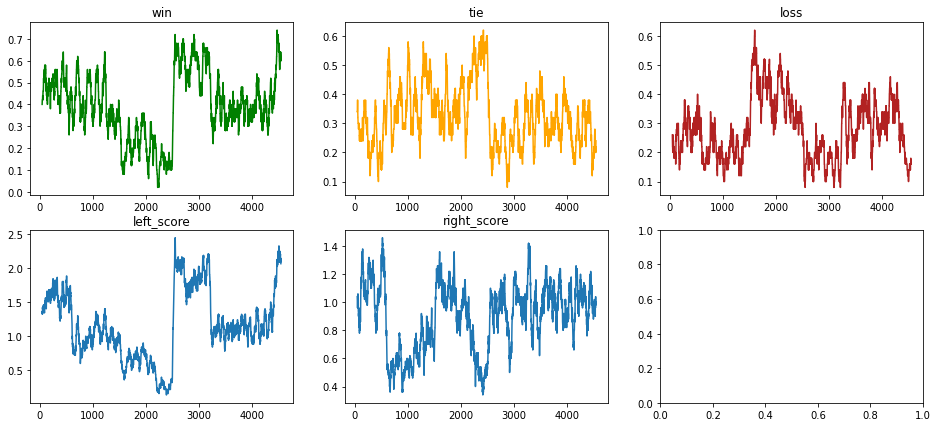

In [19]:
n_start = 0
grp_size = 50

su = scores.iloc[n_start:].rolling(grp_size).mean()
# su = scores.iloc[n_start:].groupby(scores.iloc[n_start:].index // grp_size).mean()

f, axes = plt.subplots(2, 3, figsize=(16, 7))
su.win.plot(ax=axes[0][0], title="win", color="green")
su.tie.plot(ax=axes[0][1], title="tie", color="orange")
su.loss.plot(ax=axes[0][2], title="loss", color="firebrick")
su.left_score.plot(ax=axes[1][0], title="left_score")
su.right_score.plot(ax=axes[1][1], title="right_score")

In [16]:
# scores.iloc[7676:7711]

## Shot data

In [ ]:
shots = models.make_shot_dataset()
shots.shape

In [ ]:
shots.head()

In [ ]:
shots.describe()

In [ ]:
shots.groupby(shots["eval_data.dist_to_goalie"].notna()).target.mean()

In [ ]:
shots.target.value_counts()

In [ ]:
shots.groupby("game_id").size().plot()

In [ ]:
for col in [
    "eval_data.view_of_net",
    "eval_data.distance_to_net",
    "eval_data.dist_to_goalie",
#     "eval_data.step",
]:
    f, axes = plt.subplots(1, 2, figsize=(14, 4))
    sns.kdeplot(x=shots[col][shots.target == 1], label="1", ax=axes[0])
    sns.kdeplot(x=shots[col][shots.target == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=shots[col], y=shots.target, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sns.regplot(x=shots["eval_data.dist_to_goalie"].clip(lower=0.22), y=shots.target, x_bins=20)

## Short pass data

In [ ]:
short = models.make_short_pass_dataset()
short.shape

In [ ]:
ax = short.groupby(short["eval_data.prb_success"].round(2)).target.mean().plot()
ax.plot([0, 1], [0, 1])

In [ ]:
short.groupby("game_id").size().plot()

In [ ]:
short.target.rolling(1_000).mean().plot()

In [ ]:
(short.step - short.queued_at).value_counts().sort_index().plot.bar()

In [ ]:
short["eval_data.timestep"].value_counts().plot.bar()

In [ ]:
short.head()

In [ ]:
short.describe()

In [ ]:
# short["pos_score_data.view.val"] = short["pos_score_data.view"].clip(upper=1)

In [ ]:
# short["eval_data.small_cone_angle"] = short["eval_data.small_cone_angle"].clip(upper=40)

In [ ]:
short_pass_cols = [
     "step",
     "eval_data.pass_error",
     "eval_data.pass_error_diff",
     "pos_score_data.posx",
     "pos_score_data.dnet",
     "pos_score_data.view",
     "pos_score_data.dopp",
     "pos_score_data.kopp",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
     "eval_data.opp_dist_to_line",
     "eval_data.opp_dist_to_active",
     "eval_data.prb_success",
     "eval_data.kick_countdown",
     "eval_data.timestep",
]

In [ ]:
tmp = short.sample(30_000)
for col in short_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.target == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.target == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.target, x_bins=20, ax=axes[1], fit_reg=False)
    axes[0].legend()
    plt.show()

In [ ]:
sm.OLS(short.target, sm.add_constant(short[short_pass_cols])).fit().summary()

In [ ]:
short_pass_cols = [
#      "step",
#      "eval_data.pass_error",
     "eval_data.pass_error_diff",
     "pos_score_data.posx",
     "pos_score_data.dnet",
     "pos_score_data.view",
     "pos_score_data.dopp",
     "pos_score_data.kopp",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
     "eval_data.opp_dist_to_line",
     "eval_data.opp_dist_to_active",
     "eval_data.kick_countdown",
#      "eval_data.prb_success",
]

In [ ]:
sm.OLS(short.target, sm.add_constant(short[short_pass_cols])).fit().summary()

In [ ]:
sns.displot(grid_search.predict_proba(short[short_pass_cols])[:, 1])

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(short[short_pass_cols], short.target)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(short[short_pass_cols])[:, 1])

In [ ]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [ ]:
grid_search.best_estimator_.booster_.save_model("short_pass_model.txt")

In [ ]:
short_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [ ]:
short_pipe.fit(short[short_pass_cols], short.success)

In [ ]:
short_pipe.named_steps.ridgeclassifiercv.alpha_

In [ ]:
joblib.dump(short_pipe, "short_pass_model.pkl")

## Long pass data

In [ ]:
long = models.make_long_pass_dataset()
long.shape

In [ ]:
ax = long.groupby(long["eval_data.prb_success"].round(2)).target.mean().plot()
ax.plot([0, 1], [0, 1])

In [ ]:
long.groupby("game_id").size().plot()

In [ ]:
(long.step - long.queued_at).value_counts().sort_index().plot.bar()

In [ ]:
long.head()

In [ ]:
long.describe()

In [ ]:
long["pos_score_data.view.val"] = long["pos_score_data.view.val"].clip(upper=1)

In [ ]:
long_pass_cols = [
     "step",
     "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
     "eval_data.prb_success",
]

In [ ]:
tmp = long.sample(30_000)
for col in long_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.success == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.success == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.success, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

In [ ]:
long_pass_cols = [
#      "step",
#      "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
#      "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
#      "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
#      "eval_data.prb_success",
]

In [ ]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 101, 10)),
    "num_leaves": [5, 10, 20, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(long[long_pass_cols], long.success)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(long[long_pass_cols])[:, 1])

In [ ]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [ ]:
grid_search.best_estimator_.booster_.save_model("long_pass_model.txt")

In [ ]:
long_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [ ]:
long_pipe.fit(long[long_pass_cols], long.success)

In [ ]:
long_pipe.named_steps.ridgeclassifiercv.alpha_

In [ ]:
joblib.dump(long_pipe, "long_pass_model.pkl")

## Handling data

In [ ]:
handle = sim.make_handling_dataset()
handle.shape

In [ ]:
handle.groupby("game_id").size().plot()

In [ ]:
handle.groupby("game_id").size().tail(500)

In [ ]:
handle.head()

In [ ]:
handle.describe()

In [ ]:
handle["pos_score_data.view.val"] = handle["pos_score_data.view.val"].clip(upper=1)

In [ ]:
handle_cols = [
     "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
     "eval_data.prb_failure",
]

In [ ]:
tmp = handle.sample(30_000)
for col in handle_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.failure == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.failure == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.failure, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

In [ ]:
handle_cols = [
#      "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
#      "eval_data.prb_failure",
]

In [ ]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(handle[handle_cols], handle.failure)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(handle[handle_cols])[:, 1])

In [ ]:
grid_search.best_estimator_.booster_.save_model("handle_model.txt")

In [ ]:
handle_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [ ]:
handle_pipe.fit(handle[handle_cols], handle.failure)

In [ ]:
handle_pipe.named_steps.ridgeclassifiercv.alpha_

In [ ]:
joblib.dump(handle_pipe, "handle_model.pkl")

## Position score data

In [ ]:
pos_score = models.make_position_score_dataset(incremental=False)
pos_score.shape

In [ ]:
pos_score.head()

In [ ]:
pos_score.describe()

In [ ]:
pos_score["pred"] = np.random.uniform(size=len(pos_score))

In [ ]:
pos_score["posx_a"] = pos_score["posx"] * (pos_score["posx"] > -0.5)
pos_score["posx_b"] = pos_score["posx"] * (pos_score["posx"] > 0.0)
pos_score["posx_c"] = pos_score["posx"] * (pos_score["posx"] > 0.5)
pos_score["logx"] = np.log10(pos_score["posx"] + 2.0)

In [ ]:
pos_score["posy"] = pos_score["posy"].abs()
pos_score["posy2"] = pos_score["posy"] ** 2
pos_score["dnet2"] = pos_score["dnet"] ** 2
pos_score["view2"] = pos_score["view"] ** 2
pos_score["dopp2"] = pos_score["dopp"] ** 2
pos_score["dopp_a"] = pos_score["dopp"] * (pos_score["dopp"] < 0.05)
pos_score["dopp_b"] = pos_score["dopp"] * (pos_score["dopp"] < 0.1)
pos_score["kopp_log"] = np.log10(pos_score["kopp"])

In [ ]:
X_cols = [
    "posx",
    "posx_a",
    "posx_b",
    "posx_c",
    "logx",
    "posy",
    "posy2",
    "dnet",
    "dnet2",
    "view",
    "view2",
    "dopp",
    "dopp_a",
    "dopp_b",
    "dopp2",
    "kopp",
    "kopp_log",
]

In [ ]:
from IPython.display import clear_output, display
from ipywidgets import Output

In [ ]:
mean_pred = [np.nan]
median_pred = [np.nan]
std_pred = [np.nan]

out = Output()
display(out)

for _ in tqdm(range(500)):
    
    out.clear_output(wait=True)
    
    pos_score["target"] = (pos_score.reward * 50.0 + pos_score.pred.shift(-1) * 0.99).clip(lower=0.0, upper=50.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = sm.add_constant(pos_score[X_cols])
    mask = pos_score.target.notna()
    ols_model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = ols_model.predict(X)
    
    mean_pred.append(pos_score.pred.mean())
    median_pred.append(pos_score.pred.median())
    std_pred.append(pos_score.pred.std())
    f, axes = plt.subplots(1, 3, figsize=(12, 3))
    pd.Series(mean_pred).plot(ax=axes[0], title="mean")
    pd.Series(median_pred).plot(ax=axes[1], title="median")
    pd.Series(std_pred).plot(ax=axes[2], title="std")
    
    with out:
        plt.show()

In [ ]:
ols_model.summary()

In [ ]:
ols_model.params.tolist()

In [ ]:
sns.displot(pos_score.pred)

In [ ]:
tmp = pos_score.sample(50_000)
for col in X_cols: 
    print(col)
    sns.regplot(x=tmp[col], y=tmp.pred, x_bins=20, fit_reg=False)
    plt.show()

In [ ]:
stop

# Ball physics

In [ ]:
stop

In [ ]:
ball_cols = [c for c in df.columns if c.startswith("ball")]
df[[c + "_diff" for c in ball_cols]] = df[ball_cols].diff().shift(-1)
df["ball_in_air"] = df.ball_pos_z > 0.7
df["ball_vel"] = (df.ball_dir_x**2 + df.ball_dir_y**2 + df.ball_dir_z**2) ** 0.5

In [ ]:
df.head()

In [ ]:
df[df.ball_in_air].head(30)

In [ ]:
df.ball_pos_z.plot(figsize=(15, 5))

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_pos_z_diff",
#     c="ball_vel",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
ax.set_ylim(-1, 1)
abline(ax, 1, -0.05)

In [ ]:
df[df.ball_in_air & (df.ball_dir_z != 0.0) & (df.ball_dir_z_diff > 1)]
df[(df.step >= 1660) & (df.step <= 1670)]

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_dir_z_diff",
#     c="ball_pos_z",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
abline(ax, -0.01, -0.08)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_pos_x_diff")
ax.plot([-0.1, 0.1], [-0.1, 0.1])

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_dir_x_diff")
ax.plot([-0.04, 0.04], [-0.04, 0.04])
abline(ax, -0.05, 0)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_y != 0.0)].plot.scatter(x="ball_dir_y", y="ball_dir_y_diff")
ax.plot([-0.01, 0.01], [-0.01, 0.01])
abline(ax, -0.05, 0)

In [ ]:
def abline(ax, slope, intercept):
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--')

In [ ]:
(df.ball_pos_z_diff - df.ball_dir_z).mean()